In [1]:
import numpy as np
import pandas as pd
import glob
import json
import math
from natsort import natsorted
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import classification_report, f1_score, accuracy_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# model predictions

In [2]:
testResults = pd.read_json('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/NoisyLabelsRelabeled_2261_test_yPred_preTrainFT_RoBERTa.json', orient='records')

In [3]:
testResults.head(1)

,replyDate,text,telegramChannel,Label,y_pred,prob_scores
0,1665949580,When will the committee release all the film f...,ResisttheMainstream.json,1,1,"[1.847e-05, 0.9999773502, 4.2185e-06]"


In [4]:
testResults.shape

(2261, 6)

In [5]:
testResults['y_pred'].value_counts()

2    809
0    748
1    704
Name: y_pred, dtype: int64

In [6]:
# Print the first few rows to verify
testResults.head()

,replyDate,text,telegramChannel,Label,y_pred,prob_scores
0,1665949580,When will the committee release all the film f...,ResisttheMainstream.json,1,1,"[1.847e-05, 0.9999773502, 4.2185e-06]"
1,1617995646,Why NoT FULTON??? Fact is they have the fraud...,AnalyzingAmerica.json,1,1,"[1.61886e-05, 0.9999779463, 5.91e-06]"
2,1654013812,If the Military doesn't do something I may not...,ThePatriotVoice.json,2,2,"[0.0007895456, 2.40882e-05, 0.999186337]"
3,1681075811,Hopefully he’s going to Gitmo,ResisttheMainstream.json,2,2,"[2.5638400000000002e-05, 9.2219e-06, 0.9999651..."
4,1621801796,So then can we now sue them for all the stres...,AnalyzingAmerica.json,1,1,"[1.2539600000000001e-05, 0.9999802113, 7.23710..."


In [7]:
precision_score(testResults['Label'], testResults['y_pred'], average='weighted')

0.9586891046485972

In [8]:
recall_score(testResults['Label'], testResults['y_pred'], average='weighted')

0.9584254754533392

In [9]:
f1_score(testResults['Label'], testResults['y_pred'], average='weighted')

0.9584834148813025

In [10]:
accuracy_score(testResults['Label'], testResults['y_pred'])

0.9584254754533392

In [11]:
# Generate classification report
class_report = classification_report(testResults['Label'], testResults['y_pred'])

In [12]:
print("Classification Report:\n", class_report)

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94       732
           1       0.97      0.97      0.97       703
           2       0.97      0.95      0.96       826

    accuracy                           0.96      2261
   macro avg       0.96      0.96      0.96      2261
weighted avg       0.96      0.96      0.96      2261



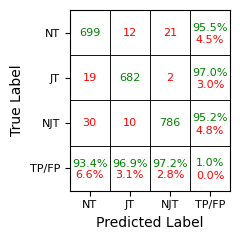

[[699.          12.          21.          95.49180328]
 [ 19.         682.           2.          97.01280228]
 [ 30.          10.         786.          95.15738499]
 [ 93.44919786  96.875       97.15698393   0.        ]]


In [13]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
import pandas as pd

df = testResults.copy()

# Calculate the confusion matrix
conf_matrix = confusion_matrix(df['Label'], df['y_pred'])
# Calculate sums for each column and row
row_sums = conf_matrix.sum(axis=1)
col_sums = conf_matrix.sum(axis=0)
# Calculate required percentages for columns
col_percent = [
    [
        conf_matrix[i, i] / row_sums[i] * 100 if row_sums[i] > 0 else 0,  # TP percentage
        (row_sums[i] - conf_matrix[i, i]) / row_sums[i] * 100 if row_sums[i] > 0 else 0  # FP percentage
    ] for i in range(conf_matrix.shape[0])
]
# Calculate required percentages for rows
row_percent = [
    [
        conf_matrix[i, i] / col_sums[i] * 100 if col_sums[i] > 0 else 0,  # TP percentage
        (col_sums[i] - conf_matrix[i, i]) / col_sums[i] * 100 if col_sums[i] > 0 else 0  # FP percentage
    ] for i in range(conf_matrix.shape[0])
]
# Create a 4x4 matrix for the confusion matrix and the calculated percentages
sum_matrix = np.zeros((4, 4))  # Create a 4x4 matrix
# print(conf_matrix)
sum_matrix[:-1, :-1] = conf_matrix  # Top-left 3x3 for the confusion matrix
# print(sum_matrix)
# Fill last row and column with calculated percentages
for i in range(3):
    sum_matrix[i, -1] = col_percent[i][0]  # TP % in last column
    sum_matrix[i, -2] = col_percent[i][1]  # FP % in last column
    sum_matrix[-1, i] = row_percent[i][0]  # TP % in last row
    sum_matrix[-2, i] = row_percent[i][1]  # FP % in last row
# Calculate the sum for the entire confusion matrix
total_sum = conf_matrix.sum()
# Calculate the sum of the diagonal values (0,0), (1,1), (2,2)
diagonal_sum = conf_matrix[0, 0] + conf_matrix[1, 1] + conf_matrix[2, 2]
# Calculate the sum of all values except for the diagonal ones
off_diagonal_sum = total_sum - diagonal_sum
# Calculate the desired values for the bottom right cell
bottom_right_value_1 = diagonal_sum / total_sum
bottom_right_value_2 = off_diagonal_sum / total_sum
# print(sum_matrix)
# Create a figure with a specified width and height
# plt.figure(figsize=(3.5, 3.5))
plt.figure(figsize=(2.5, 2.5))
# Create a color array for the confusion matrix (4x4, each cell has 3 values for RGB)
colors = np.ones((4, 4, 3))  # Initialize all cells to white [1, 1, 1]
# Create the colormap from the colors array
cmap = plt.cm.colors.ListedColormap(colors.reshape(-1, 3))
# print(sum_matrix)
sum_matrix[:-1, :-1] = conf_matrix  # Top-left 3x3 for the confusion matrix
# print("afeter change")
# print(sum_matrix)
# Display the confusion matrix with percentages
plt.imshow(sum_matrix, cmap=cmap, aspect='auto')

# Add text for the confusion matrix and metrics
for i in range(4):
    for j in range(4):
        # Only display numeric values for the confusion matrix cells
        if i < 3 and j < 3:  # Confusion matrix cells
            color = 'green' if i == j else 'red'  # Set diagonal color to green
            plt.text(j, i, f"{sum_matrix[i, j]:.0f}", ha='center', va='center', color=color, fontsize=8)
        
        # True Positives (green) and False Positives (red) in last row (TP/FP for columns)
        elif i == 3 and j < 3:  # TP percentages in the last row
            plt.text(j, i-0.1, f"{row_percent[j][0]:.1f}%", ha='center', va='center', color='green', fontsize=8)
            plt.text(j, i + 0.15, f"{row_percent[j][1]:.1f}%", ha='center', va='center', color='red', fontsize=8)
        
        # True Positives (green) and False Positives (red) in the last column (TP/FP for rows)
        elif j == 3 and i < 3:  # Percentages in the last column (for rows)
            plt.text(j, i, f"{col_percent[i][0]:.1f}%", ha='center', va='bottom', color='green', fontsize=8)  # TP (upper line)
            plt.text(j, i+ 0.06, f"{col_percent[i][1]:.1f}%", ha='center', va='top', color='red', fontsize=8)  # FP (lower line)

        # True Positives (green) and False Positives (red) in the last cell (TP/FP for rows)
        elif j == 3 and i == 3:  # Percentages in the last column (for rows)
            plt.text(j, i, f"{bottom_right_value_1:.1f}%", ha='center', va='bottom', color='green', fontsize=8)  # TP (upper line)
            plt.text(j, i+ 0.06, f"{bottom_right_value_2:.1f}%", ha='center', va='top', color='red', fontsize=8)  # FP (lower line)

# Set ticks and labels
plt.xticks(ticks=np.arange(4), labels=['NT', 'JT', 'NJT', 'TP/FP'], fontsize=8)
plt.yticks(ticks=np.arange(4), labels=['NT', 'JT', 'NJT', 'TP/FP'], fontsize=8)
# Add borders
for i in range(4):
    for j in range(4):
        plt.gca().add_patch(plt.Rectangle((j - 0.5, i - 0.5), 1, 1, edgecolor='black', facecolor='none', lw=0.5))
# Aesthetic customizations
# plt.gca().set_facecolor('#ffffff')  # White background for better contrast
plt.grid(False)  # Disable grid for a clean look
# Add labels
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
# Show the plot
plt.tight_layout()

plt.savefig('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/ConfusionMatrixDisplay.png', format='png', dpi=1200)


plt.show()

print(sum_matrix)

# Misclassifications

In [14]:
# Filter misclassifications (where Label != y_pred)
df = testResults.copy()
misclassified_df = df[df['Label'] != df['y_pred']]
classified_df = df[df['Label'] == df['y_pred']]

# Display the misclassified DataFrame
print(misclassified_df.shape)

(94, 6)


In [15]:
misclassified_df.to_csv('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/Labeled_2261_test_yPred_preTrainFT_RoBERTa_NoiseCorrectedData_MisClas.csv')

In [16]:
classified_df.to_csv('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/Labeled_2261_test_yPred_preTrainFT_RoBERTa_NoiseCorrectedData_ClasCorrectly.csv')

# Prediction and Label bias comparison

In [17]:
# Grouping by 'telegramChannel'
df = testResults.copy()
result_df = df.groupby('telegramChannel').agg(
    no_of_unique_telegramChannel=('telegramChannel', 'size'),
    
    # Counts for y_pred (predictions)
    label_0_pred_count=('y_pred', lambda x: (x == 0).sum()),
    label_1_pred_count=('y_pred', lambda x: (x == 1).sum()),
    label_2_pred_count=('y_pred', lambda x: (x == 2).sum()),
    
    # Counts for Label (actual)
    label_0_actual_count=('Label', lambda x: (x == 0).sum()),
    label_1_actual_count=('Label', lambda x: (x == 1).sum()),
    label_2_actual_count=('Label', lambda x: (x == 2).sum())
).reset_index()

# Renaming columns to make it more readable
result_df.columns = ['telegramChannel', 'Sample count', 'No Threat (Pred)', 'Judicial Threat (Pred)', 'Non-Judicial Threat (Pred)',
                    'No Threat (Actual)', 'Judicial Threat (Actual)', 'Non-Judicial Threat (Actual)']

# Step 1: Remove '.json' from 'telegramChannel'
result_df['telegramChannel'] = result_df['telegramChannel'].str.replace('.json', '', regex=False)

# Step 2: Calculate percentages for 'No Threat', 'Judicial Threat', and 'Non-Judicial Threat' (Predictions)
result_df['No Threat (Pred %)'] = (result_df['No Threat (Pred)'] / result_df['Sample count'] * 100).round(2)
result_df['Judicial Threat (Pred %)'] = (result_df['Judicial Threat (Pred)'] / result_df['Sample count'] * 100).round(2)
result_df['Non-Judicial Threat (Pred %)'] = (result_df['Non-Judicial Threat (Pred)'] / result_df['Sample count'] * 100).round(2)

# Step 3: Calculate percentages for 'No Threat', 'Judicial Threat', and 'Non-Judicial Threat' (Actual labels)
result_df['No Threat (Actual %)'] = (result_df['No Threat (Actual)'] / result_df['Sample count'] * 100).round(2)
result_df['Judicial Threat (Actual %)'] = (result_df['Judicial Threat (Actual)'] / result_df['Sample count'] * 100).round(2)
result_df['Non-Judicial Threat (Actual %)'] = (result_df['Non-Judicial Threat (Actual)'] / result_df['Sample count'] * 100).round(2)

# Step 4: Create new columns for combined threat (Judicial + Non-Judicial) for both Pred and Actual
result_df['Combined Threat (Pred %)'] = result_df['Judicial Threat (Pred %)'] + result_df['Non-Judicial Threat (Pred %)']
result_df['Combined Threat (Actual %)'] = result_df['Judicial Threat (Actual %)'] + result_df['Non-Judicial Threat (Actual %)']

# Step 5: Sort by 'Combined Threat (Pred %)' in ascending order
result_df = result_df.sort_values(by='Sample count', ascending=True)

# Step 6: Keep only the relevant columns
result_df = result_df[['telegramChannel', 'Sample count', 
                       'No Threat (Pred %)', 'Judicial Threat (Pred %)', 'Non-Judicial Threat (Pred %)', 
                       'No Threat (Actual %)', 'Judicial Threat (Actual %)', 'Non-Judicial Threat (Actual %)']]

# Display the result
print(result_df)


             telegramChannel  Sample count  No Threat (Pred %)  \
0                  AlexJones            15               60.00   
5            FreedomFighters            15                6.67   
6                   InfoWars            20               45.00   
7            LacansWhreHouse            20               75.00   
9               PrayingMedic            22               59.09   
15          UnitedAnarchists            24               70.83   
11                  RiotDogs            25               68.00   
3        COVIDVACCINEVICTIMS            28               60.71   
2   AnticapitalistSurrealism            29               68.97   
8       PatriotStreetfighter            55               58.18   
4              DonaldTrumpJr           101               46.53   
12           ThePatriotVoice           133               42.86   
14    TrumpSupportersChannel           196               34.69   
13       TheTrumpRepublicans           279               33.33   
1         

# Precision-Recall Curve

{0: 0.9500567295442011, 1: 0.9670801066425317, 2: 0.9811876661071377}


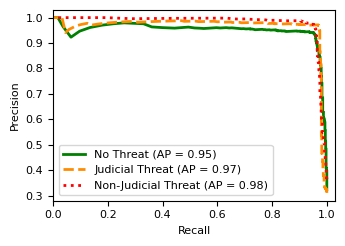

In [18]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming df 
df = testResults.copy()
# df = pd.read_json('/home/ravi/raviProject/DataModelsResults/Results/PreTrainAgain_FineTune_RoBERTa_400/preTrainedModel/CustomPreTrainedClassifier/Labeled_2261_test_yPred_preTrainFT_RoBERTa_withProbScores.json', orient='records')
y_true = df['Label']
y_probs = np.array(df['prob_scores'].tolist())  # Probabilities for each class (3 columns for 3 classes)

# Binarize the labels for multi-class Precision-Recall (One-vs-Rest strategy)
n_classes = 3
y_bin = label_binarize(y_true, classes=[0, 1, 2])

# Class names corresponding to the labels
class_names = {0: 'No Threat', 1: 'Judicial Threat', 2: 'Non-Judicial Threat'}

# Compute Precision-Recall and Average Precision for each class
precision = dict()
recall = dict()
average_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], y_probs[:, i])
    average_precision[i] = average_precision_score(y_bin[:, i], y_probs[:, i])

# Set global font size to 8
plt.rcParams.update({'font.size': 8})

# Define line styles
line_styles = ['-', '--', ':']  # Solid, dashed, and dotted lines

# Plotting the Precision-Recall curves
plt.figure(figsize=(3.5, 2.5))
colors = cycle(['green', 'darkorange', 'red'])

for i, (color, line_style) in zip(range(n_classes), zip(colors, line_styles)):
    plt.plot(recall[i], precision[i], color=color, lw=2, linestyle=line_style,
             label='{} (AP = {:.2f})'.format(class_names[i], average_precision[i]))


print(average_precision)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend(loc='lower left')
plt.xlim([0.0, 1.03])
plt.ylim([0.28, 1.03])
plt.tight_layout()

plt.savefig('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/PrecisionRecallCurve.png', format='png', dpi=1200)

plt.show()

# Temporal robustness

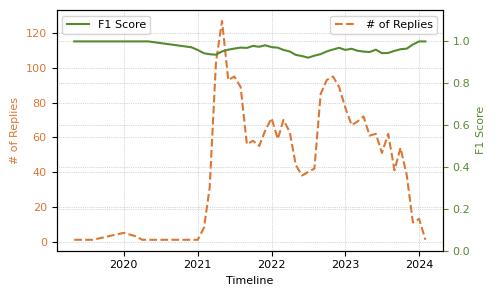

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
from scipy.signal import savgol_filter

# Sample DataFrame (replace with your actual data)
df = testResults.copy()

# 1. Convert 'replyDate' from Unix timestamp to datetime
df['replyDate'] = pd.to_datetime(df['replyDate'], unit='s')

# 2. Extract month and year from 'replyDate'
df['month'] = df['replyDate'].dt.to_period('M')

# 3. Calculate F1 score (weighted) and count texts per month
monthly_f1_scores = []
monthly_counts = []
sorted_months = []

for month, group in df.groupby('month'):
    f1 = f1_score(group['Label'], group['y_pred'], average='weighted')
    monthly_f1_scores.append(f1)
    monthly_counts.append(len(group))
    sorted_months.append(month)

# 4. Sort the data by month in ascending order
sorted_indices = sorted(range(len(sorted_months)), key=lambda i: sorted_months[i])
sorted_months = [sorted_months[i] for i in sorted_indices]
monthly_f1_scores = [monthly_f1_scores[i] for i in sorted_indices]
monthly_counts = [monthly_counts[i] for i in sorted_indices]

# Convert sorted months to datetime for plotting
months = pd.to_datetime([str(m) for m in sorted_months])

# 5. Adjust the window size for Savitzky-Golay filter
# Apply Savitzky-Golay filter to smooth the F1 score
smoothed_f1_scores = savgol_filter(monthly_f1_scores, 5, 1)  # Window size, polynomial order
smoothed_f1_scores = np.clip(smoothed_f1_scores, 0, 1)
# smoothed_f1_scores = monthly_f1_scores

# 6. Plotting
fig, ax1 = plt.subplots(figsize=(5, 3))

# Plot the number of texts (left y-axis)
ax1.plot(months, monthly_counts, linestyle='--', color='#DC7633', label='# of Replies')
ax1.set_xlabel('Timeline')
ax1.set_ylabel('# of Replies', color='#DC7633')
ax1.tick_params(axis='y', labelcolor='#DC7633')

# 7. Create the second y-axis for F1 score
ax2 = ax1.twinx()
ax2.plot(months, smoothed_f1_scores, color='#558B2F', label='F1 Score')
ax2.set_ylabel('F1 Score', color='#558B2F')
ax2.tick_params(axis='y', colors='#558B2F')

# Ensure F1 score axis starts at 0 and does not show negative values
ax2.set_ylim(0,1.15)
# Manually set the ticks
# ax2.set_yticks(np.linspace(0, 1.2, 7))

# Add legends for both plots
ax1.legend(loc='best', fontsize=8)
ax2.legend(loc='upper left', fontsize=8)

# Add grid lines
ax1.grid(True, which='both', linestyle=':', linewidth=0.5)
ax2.grid(True, which='both', linestyle=':', linewidth=0.5)
# plt.xlim([0.0, 1.03])
# plt.ylim([0.28, 1.03])
# 8. Final formatting
# fig.suptitle('Monthly Number of Texts and Weighted F1 Scores (Smoothed and Original)')
fig.tight_layout()

plt.savefig('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/Temporal_F1_preTrainFT_RoBERTa_NoiseCorrectedData.png', format='png', dpi=1200)

plt.show()

# External case study (OOD)

In [37]:
dfEX = pd.read_json('/home/ravi/raviProject/DataModelsResults/UXUI/data/Data/remaining_V7_1M_NotUsed_yPred_preTrainFT_RoBERTa.json', orient='records')

In [38]:
dfEX.shape

(1000000, 6)

In [39]:
dfEX.head()

,msgDate,msg,replyDate,text,telegramChannel,y_pred
0,1617742775,RINO senator gets bad news!\n\n,1617831302,First of many that need to go.,AnalyzingAmerica.json,0
1,1621080177,Pavel B why dont you get one of these and...,1621080261,geez Captain that seems a bit extreme is it not?,PatriotStreetfighter.json,0
2,1674622933,🔴 35-Year-Old Middle School Teacher Collapses...,1674715049,Jab,ResisttheMainstream.json,0
3,1665931205,🔴 New York Times Hit With Online Backlash Ove...,1665950107,Ron Johnson is getting brutally attacked from ...,ResisttheMainstream.json,0
4,1664148018,🔴 Disturbing Video: 23-Year-Old Former Intern...,1664148223,Why would someone put a 😁 on this post? \n\nSi...,ResisttheMainstream.json,0


In [40]:
# Grouping by 'telegramChannel'
df = dfEX.copy()
result_df = df.groupby('telegramChannel').agg(
    no_of_unique_telegramChannel=('telegramChannel', 'size'),
    label_0_count=('y_pred', lambda x: (x == 0).sum()),
    label_1_count=('y_pred', lambda x: (x == 1).sum()),
    label_2_count=('y_pred', lambda x: (x == 2).sum())
).reset_index()

# Renaming columns to make it more readable
result_df.columns = ['telegramChannel', 'Sample count', 'No Threat', 'Judicial Threat', 'Non-Judicial Threat']

# Step 1: Remove '.json' from 'telegramChannel'
result_df['telegramChannel'] = result_df['telegramChannel'].str.replace('.json', '', regex=False)

# Step 2: Calculate percentages for 'No Threat', 'Judicial Threat', and 'Non-Judicial Threat'
result_df['No Threat (%)'] = (result_df['No Threat'] / result_df['Sample count'] * 100).round(2)
result_df['Judicial Threat (%)'] = (result_df['Judicial Threat'] / result_df['Sample count'] * 100).round(2)
result_df['Non-Judicial Threat (%)'] = (result_df['Non-Judicial Threat'] / result_df['Sample count'] * 100).round(2)

# Step 3: Create a new column for combined threat (Judicial + Non-Judicial)
result_df['Combined Threat (%)'] = result_df['Judicial Threat (%)'] + result_df['Non-Judicial Threat (%)']

# Step 4: Sort by 'Non-Judicial Threat (%)' in ascending order
result_df = result_df.sort_values(by='Combined Threat (%)', ascending=True)

# Step 5: Keep only the relevant columns
result_df = result_df[['telegramChannel', 'Sample count', 'No Threat (%)', 'Judicial Threat (%)', 'Non-Judicial Threat (%)', 'Combined Threat (%)']]

# Display the result
print(result_df)

             telegramChannel  Sample count  No Threat (%)  \
8            LacansWhreHouse         41399          99.28   
12                  RiotDogs         41479          98.98   
10              PrayingMedic         36625          98.92   
2   AnticapitalistSurrealism         42042          98.89   
16          UnitedAnarchists         29993          98.87   
4        COVIDVACCINEVICTIMS         24709          98.26   
9       PatriotStreetfighter         58240          97.90   
3          BlackCrimesMatter           600          97.83   
5              DonaldTrumpJr         73258          97.54   
13           ThePatriotVoice         83482          96.43   
6            FreedomFighters          7607          96.08   
0                  AlexJones          5509          95.63   
15    TrumpSupportersChannel         74522          93.78   
11       ResisttheMainstream        241033          93.76   
7                   InfoWars          8774          93.62   
14       TheTrumpRepubli

# XAI for RoBERTa+

## BertViz, Captum, SHAP, LIME

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884


========Prediction=========
Predicted label: 1
========BertViz=========


<IPython.core.display.Javascript object>

None

========Captum=========


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
Judicial Threat,Judicial Threat (3.54),Judicial Threat,1.46,#s Go figure they are criminals lock them away for a very long time . #/s


========SHAP: Model Explanation=========


========LIME=========


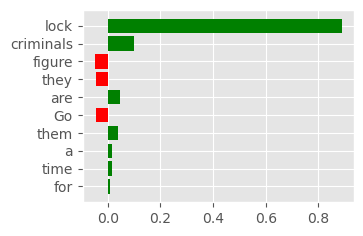

In [56]:
import torch
import numpy as np
from transformers import RobertaTokenizer, RobertaForSequenceClassification, utils
from IPython.display import display

# ---------------------------
# 1. Load Model & Tokenizer
# ---------------------------
modelPATH = "/home/ravi/raviProject/DataModelsResults/Results/PreTrainAgain_FineTune_RoBERTa_400/preTrainedModel/CustomPreTrainedClassifier"
tokenizer = RobertaTokenizer.from_pretrained(modelPATH)
# Ensure output_attentions=True for BertViz
model = RobertaForSequenceClassification.from_pretrained(modelPATH, num_labels=3, output_attentions=True)
model.eval()

# ---------------------------
# 2. Define the input text and target label
# ---------------------------
text = "Go figure they are criminals lock them away for a very long time."
target = 1  # Specify the target label for explanation

print("========Prediction=========")
# ---------------------------
# 3. Prediction (shared for all methods)
# ---------------------------
# Tokenize input for model inference
encoded = tokenizer(text, return_tensors="pt", add_special_tokens=True)
outputs = model(**encoded)
logits = outputs.logits
predicted_label = torch.argmax(logits, dim=1).item()
print("Predicted label:", predicted_label)

print("========BertViz=========")
# ---------------------------
# 4. BertViz: Visualize Attention Heads
# ---------------------------
from bertviz import head_view

# Get attentions and tokens for visualization
attentions = outputs.attentions  # List of attention tensors from each layer
tokens = tokenizer.convert_ids_to_tokens(encoded['input_ids'][0])
# Display interactive head view (works in Jupyter Notebook)
head_viz = head_view(attentions, tokens)
display(head_viz)

print("========Captum=========")
# ---------------------------
# 7. Captum: Layer Integrated Gradients Explanation
# (Using your provided code block)
# ---------------------------
from captum.attr import LayerIntegratedGradients
from captum.attr import visualization as viz

# Tokenize input (again, for Captum processing)
encoded_captum = tokenizer(text, return_tensors="pt", add_special_tokens=True)

def predict(inputs, attention_mask=None):
    return model(inputs, attention_mask=attention_mask).logits

# Get predictions using the predict function
predictions = predict(encoded_captum['input_ids'], encoded_captum['attention_mask'])
# (predicted_label already obtained above)
# Initialize Layer Integrated Gradients on the model's embeddings
lig = LayerIntegratedGradients(predict, model.roberta.embeddings)

# Compute attributions for the specified target label
attributions_start, delta_start = lig.attribute(
    inputs=encoded_captum['input_ids'],
    target=torch.tensor([target]),  # Use the specified target label
    additional_forward_args=encoded_captum['attention_mask'],
    return_convergence_delta=True
)

# Sum attributions over the embedding dimension
attributions_start = attributions_start.sum(dim=-1).squeeze().detach().numpy()
# Convert input IDs to tokens
words = tokenizer.convert_ids_to_tokens(encoded_captum['input_ids'][0])
# Remove special token formatting (e.g., remove leading 'Ġ')
original_words = [token if not token.startswith('Ġ') else token[1:] for token in words]

# Normalize attributions for visualization (scaling between -1 and 1)
attributions_start = attributions_start / np.linalg.norm(attributions_start)

# Prepare data for Captum visualization
result = viz.VisualizationDataRecord(
    attributions_start,
    predictions[0][predicted_label].item(),  # Predicted score for the predicted label
    class_names[predicted_label],              # Predicted label name
    class_names[target],                       # True label name (as specified)
    class_names[predicted_label],              # Attribution label (same as predicted)
    attributions_start.sum(),                  # Total attribution score
    original_words,                            # Tokens for display
    delta_start                                # Convergence delta
)

# Render Captum visualization (in a notebook)
visualization_results = viz.visualize_text([result])


print("========SHAP: Model Explanation=========")
# ---------------------------
# 5. SHAP: Model Explanation
# ---------------------------
import shap
import transformers

# Build a prediction pipeline using your custom model and tokenizer.
# Note: Replace `return_all_scores=True` with `top_k=None` to get scores for all classes.
pred = transformers.pipeline(
    "text-classification",
    model=model,          # Your loaded model
    tokenizer=tokenizer,  # Your loaded tokenizer
    device=0,             # Use GPU if available; set to -1 for CPU
    top_k=None,           # Returns scores for all classes instead of only the top class.
)

# Create a SHAP explainer for the pipeline with output names for clarity.
explainer = shap.Explainer(pred, output_names=["No Threat", "Judicial Threat", "Non-Judicial Threat"])

# Compute SHAP values for the single text example (wrapped in a list).
shap_values = explainer([text])

# Function to clean tokens by removing the 'Ġ' prefix (common in RoBERTa tokenization)
def clean_shap_tokens(shap_values):
    cleaned_tokens = []
    for sample in shap_values.data:
        cleaned_sample = [token.replace("Ġ", "") for token in sample]
        cleaned_tokens.append(cleaned_sample)
    return cleaned_tokens

# Clean the SHAP tokens and update shap_values.data.
shap_values.data = clean_shap_tokens(shap_values)

# Visualize the SHAP values for the target classes without the 'Ġ' prefix.
shap.plots.text(shap_values)


print("========LIME=========")
# ---------------------------
# 6. LIME: Local Interpretable Model-Agnostic Explanations
# ---------------------------
import torch
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer

# Define the prediction function for LIME
def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    # Move all inputs to the same device as the model
    device = next(model.parameters()).device
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits
    probs = torch.softmax(logits, dim=1).cpu().numpy()
    return probs

# Example input (make sure these variables are defined)
# text = "Go figure they are criminals lock them away for a very long time."
# target = 1  # Specify the target label for explanation
# modelPATH = "/path/to/your/model"   (already defined when loading your model/tokenizer)

# Initialize the LIME explainer with your class names
explainer = LimeTextExplainer(class_names=["No Threat", "Judicial Threat", "Non-Judicial Threat"])

# Generate explanation for the input text
explanation = explainer.explain_instance(text, predict_proba, labels=[target])
# To show a version with num_features=10, you could uncomment the following:
# explanation = explainer.explain_instance(text, predict_proba, num_features=10, labels=[target])

# Display the explanation in a notebook (if using Jupyter)
explanation.show_in_notebook()

# Set the default font size to 8 for plotting
plt.rcParams.update({'font.size': 8})

# Generate and resize the LIME explanation figure using a ggplot style
with plt.style.context("ggplot"):
    fig = explanation.as_pyplot_figure()  # Generate the figure
    fig.set_size_inches(3.5, 2.5)          # Resize figure to 3.5x2.5 inches

    # Remove the title from the plot
    ax = fig.gca()       # Get current axes
    ax.set_title('')     # Remove title by setting it to an empty string

    # Save the figure as a PNG with 300 DPI at the specified modelPATH
    output_path = f"{modelPATH}/lime_local_explanation_plot.png"
    # fig.savefig(output_path, dpi=300, bbox_inches='tight')
    
    # Optionally display the plot
    plt.show()


## NEW

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884


========Prediction=========
Predicted label: 1
========BertViz=========


<IPython.core.display.Javascript object>

None

========Captum=========


True Label,Predicted Label,Attribution Label,Attribution Score,Word Importance
Judicial Threat,Judicial Threat (3.54),Judicial Threat,1.46,#s Go figure they are criminals lock them away for a very long time . #/s


========LIME=========


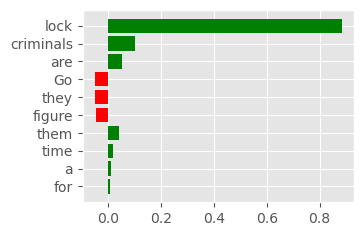

In [3]:
import torch
import numpy as np
from transformers import RobertaTokenizer, RobertaForSequenceClassification, utils
from IPython.display import display

# ---------------------------
# 1. Load Model & Tokenizer
# ---------------------------
modelPATH = "/home/ravi/raviProject/DataModelsResults/Results/PreTrainAgain_FineTune_RoBERTa_400/preTrainedModel/CustomPreTrainedClassifier"
tokenizer = RobertaTokenizer.from_pretrained(modelPATH)
# Ensure output_attentions=True for BertViz
model = RobertaForSequenceClassification.from_pretrained(modelPATH, num_labels=3, output_attentions=True)
model.eval()

# ---------------------------
# 2. Define the input text and target label
# ---------------------------
text = "Go figure they are criminals lock them away for a very long time."
target = 1  # Specify the target label for explanation
class_names=["No Threat", "Judicial Threat", "Non-Judicial Threat"]

print("========Prediction=========")
# ---------------------------
# 3. Prediction (shared for all methods)
# ---------------------------
# Tokenize input for model inference
encoded = tokenizer(text, return_tensors="pt", add_special_tokens=True)
outputs = model(**encoded)
logits = outputs.logits
predicted_label = torch.argmax(logits, dim=1).item()
print("Predicted label:", predicted_label)

print("========BertViz=========")
# ---------------------------
# 4. BertViz: Visualize Attention Heads
# ---------------------------
from bertviz import head_view

# Get attentions and tokens for visualization
attentions = outputs.attentions  # List of attention tensors from each layer
tokens = tokenizer.convert_ids_to_tokens(encoded['input_ids'][0])
# Display interactive head view (works in Jupyter Notebook)
head_viz = head_view(attentions, tokens)
display(head_viz)

print("========Captum=========")
# ---------------------------
# 7. Captum: Layer Integrated Gradients Explanation
# (Using your provided code block)
# ---------------------------
from captum.attr import LayerIntegratedGradients
from captum.attr import visualization as viz

# Tokenize input (again, for Captum processing)
encoded_captum = tokenizer(text, return_tensors="pt", add_special_tokens=True)

def predict(inputs, attention_mask=None):
    return model(inputs, attention_mask=attention_mask).logits

# Get predictions using the predict function
predictions = predict(encoded_captum['input_ids'], encoded_captum['attention_mask'])
# (predicted_label already obtained above)
# Initialize Layer Integrated Gradients on the model's embeddings
lig = LayerIntegratedGradients(predict, model.roberta.embeddings)

# Compute attributions for the specified target label
attributions_start, delta_start = lig.attribute(
    inputs=encoded_captum['input_ids'],
    target=torch.tensor([target]),  # Use the specified target label
    additional_forward_args=encoded_captum['attention_mask'],
    return_convergence_delta=True
)

# Sum attributions over the embedding dimension
attributions_start = attributions_start.sum(dim=-1).squeeze().detach().numpy()
# Convert input IDs to tokens
words = tokenizer.convert_ids_to_tokens(encoded_captum['input_ids'][0])
# Remove special token formatting (e.g., remove leading 'Ġ')
original_words = [token if not token.startswith('Ġ') else token[1:] for token in words]

# Normalize attributions for visualization (scaling between -1 and 1)
attributions_start = attributions_start / np.linalg.norm(attributions_start)

# Prepare data for Captum visualization
result = viz.VisualizationDataRecord(
    attributions_start,
    predictions[0][predicted_label].item(),  # Predicted score for the predicted label
    class_names[predicted_label],              # Predicted label name
    class_names[target],                       # True label name (as specified)
    class_names[predicted_label],              # Attribution label (same as predicted)
    attributions_start.sum(),                  # Total attribution score
    original_words,                            # Tokens for display
    delta_start                                # Convergence delta
)

# Render Captum visualization (in a notebook)
visualization_results = viz.visualize_text([result])


print("========LIME=========")
# ---------------------------
# 6. LIME: Local Interpretable Model-Agnostic Explanations
# ---------------------------
import torch
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer

# Define the prediction function for LIME
def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    # Move all inputs to the same device as the model
    device = next(model.parameters()).device
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits
    probs = torch.softmax(logits, dim=1).cpu().numpy()
    return probs

# Example input (make sure these variables are defined)
# text = "Go figure they are criminals lock them away for a very long time."
# target = 1  # Specify the target label for explanation
# modelPATH = "/path/to/your/model"   (already defined when loading your model/tokenizer)

# Initialize the LIME explainer with your class names
explainer = LimeTextExplainer(class_names=["No Threat", "Judicial Threat", "Non-Judicial Threat"])

# Generate explanation for the input text
explanation = explainer.explain_instance(text, predict_proba, labels=[target])
# To show a version with num_features=10, you could uncomment the following:
# explanation = explainer.explain_instance(text, predict_proba, num_features=10, labels=[target])

# Display the explanation in a notebook (if using Jupyter)
explanation.show_in_notebook()

# Set the default font size to 8 for plotting
plt.rcParams.update({'font.size': 8})

# Generate and resize the LIME explanation figure using a ggplot style
with plt.style.context("ggplot"):
    fig = explanation.as_pyplot_figure()  # Generate the figure
    fig.set_size_inches(3.5, 2.5)          # Resize figure to 3.5x2.5 inches

    # Remove the title from the plot
    ax = fig.gca()       # Get current axes
    ax.set_title('')     # Remove title by setting it to an empty string

    # Save the figure as a PNG with 300 DPI at the specified modelPATH
    output_path = f"{modelPATH}/lime_local_explanation_plot.png"
    # fig.savefig(output_path, dpi=300, bbox_inches='tight')
    
    # Optionally display the plot
    plt.show()


### in one plot

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884


Predicted label: 1


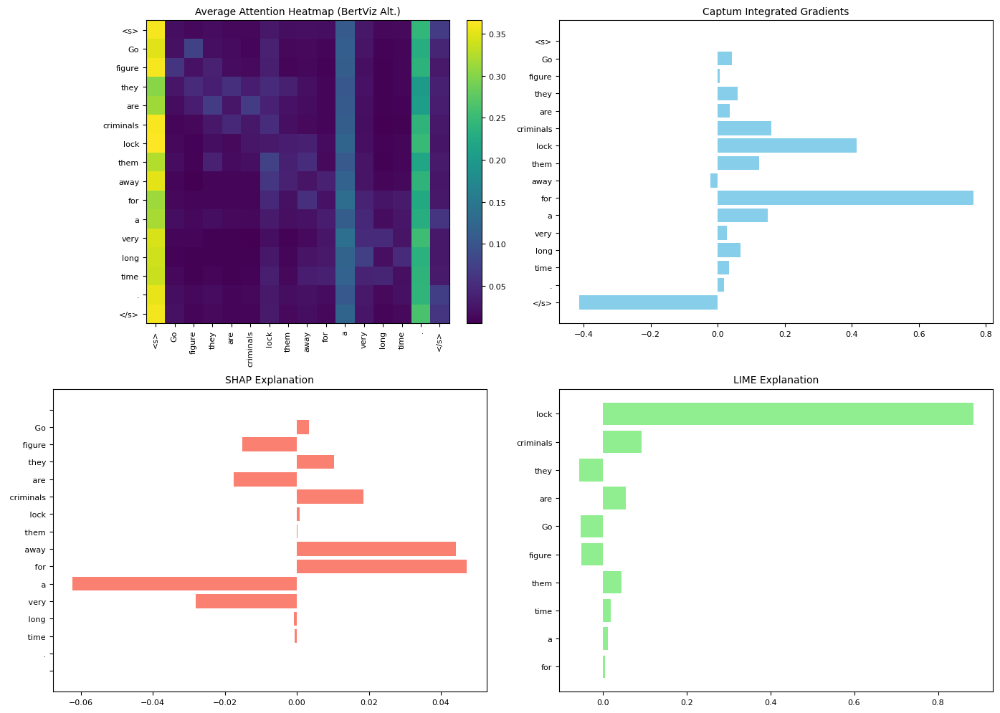

In [57]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from transformers import RobertaTokenizer, RobertaForSequenceClassification, utils
from captum.attr import LayerIntegratedGradients
from captum.attr import visualization as viz
import shap
import transformers
from lime.lime_text import LimeTextExplainer

# ---------------------------
# 1. Load Model, Tokenizer & Class Names
# ---------------------------
modelPATH = "/home/ravi/raviProject/DataModelsResults/Results/PreTrainAgain_FineTune_RoBERTa_400/preTrainedModel/CustomPreTrainedClassifier"
tokenizer = RobertaTokenizer.from_pretrained(modelPATH)
class_names = ["No Threat", "Judicial Threat", "Non-Judicial Threat"]
model = RobertaForSequenceClassification.from_pretrained(modelPATH, num_labels=3, output_attentions=True)
model.eval()

# ---------------------------
# 2. Define Input and Prediction
# ---------------------------
text = "Go figure they are criminals lock them away for a very long time."
target = 1  # Target label for explanation

# Tokenize and predict
encoded = tokenizer(text, return_tensors="pt", add_special_tokens=True)
outputs = model(**encoded)
logits = outputs.logits
predicted_label = torch.argmax(logits, dim=1).item()
print("Predicted label:", predicted_label)

# ---------------------------
# 3. BertViz Alternative: Average Attention Heatmap
# ---------------------------
# 'outputs.attentions' is a tuple of tensors: (num_layers, batch, num_heads, seq_len, seq_len)
attentions = outputs.attentions
# Average over layers and heads, and take the first example in the batch.
avg_attn = torch.stack(attentions).mean(dim=0).mean(dim=1)[0].cpu().detach().numpy()
tokens = tokenizer.convert_ids_to_tokens(encoded['input_ids'][0])
# Remove RoBERTa's special prefix ('Ġ') for display
tokens_clean = [token if not token.startswith('Ġ') else token[1:] for token in tokens]

# ---------------------------
# 4. Captum: Layer Integrated Gradients
# ---------------------------
# Re-tokenize for Captum
encoded_captum = tokenizer(text, return_tensors="pt", add_special_tokens=True)

def predict(inputs, attention_mask=None):
    return model(inputs, attention_mask=attention_mask).logits

predictions = predict(encoded_captum['input_ids'], encoded_captum['attention_mask'])
lig = LayerIntegratedGradients(predict, model.roberta.embeddings)
attributions, delta = lig.attribute(
    inputs=encoded_captum['input_ids'],
    target=torch.tensor([target]),
    additional_forward_args=encoded_captum['attention_mask'],
    return_convergence_delta=True
)
# Sum attributions over the embedding dimension and normalize
captum_attributions = attributions.sum(dim=-1).squeeze().detach().numpy()
captum_attributions = captum_attributions / np.linalg.norm(captum_attributions)
captum_tokens = tokenizer.convert_ids_to_tokens(encoded_captum['input_ids'][0])
captum_tokens_clean = [token if not token.startswith('Ġ') else token[1:] for token in captum_tokens]

# ---------------------------
# 5. SHAP: Model Explanation
# ---------------------------
# Build a prediction pipeline for SHAP (using top_k=None to get all class scores)
pred_pipeline = transformers.pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=0,  # Use GPU if available (set to -1 for CPU)
    top_k=None,
)
explainer = shap.Explainer(pred_pipeline, output_names=class_names)
shap_values = explainer([text])
# Function to clean tokens by removing the 'Ġ' prefix
def clean_shap_tokens(shap_values):
    cleaned_tokens = []
    for sample in shap_values.data:
        cleaned_sample = [token.replace("Ġ", "") for token in sample]
        cleaned_tokens.append(cleaned_sample)
    return cleaned_tokens
shap_values.data = clean_shap_tokens(shap_values)
# Extract SHAP values for the target label (for the first sample)
shap_vals = shap_values.values[0][:, target]
shap_tokens = shap_values.data[0]

# ---------------------------
# 6. LIME: Local Interpretable Model-Agnostic Explanations
# ---------------------------
def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    # Ensure inputs are on the same device as the model
    device = next(model.parameters()).device
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits
    probs = torch.softmax(logits, dim=1).cpu().numpy()
    return probs

lime_explainer = LimeTextExplainer(class_names=class_names)
lime_explanation = lime_explainer.explain_instance(text, predict_proba, labels=[target])
# Get LIME explanation as a list of (feature, weight) pairs for the target label.
lime_explanation_list = lime_explanation.as_list(label=target)
lime_features = [item[0] for item in lime_explanation_list]
lime_weights = [item[1] for item in lime_explanation_list]

# ---------------------------
# 7. Create a 2x2 Plot with All Four Explanations
# ---------------------------
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: BertViz Alternative - Average Attention Heatmap
ax = axs[0,0]
im = ax.imshow(avg_attn, cmap='viridis')
ax.set_title("Average Attention Heatmap (BertViz Alt.)", fontsize=10)
ax.set_xticks(np.arange(len(tokens_clean)))
ax.set_xticklabels(tokens_clean, rotation=90, fontsize=8)
ax.set_yticks(np.arange(len(tokens_clean)))
ax.set_yticklabels(tokens_clean, fontsize=8)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# Subplot 2: Captum Integrated Gradients
ax = axs[0,1]
ax.barh(range(len(captum_tokens_clean)), captum_attributions, color='skyblue')
ax.set_yticks(range(len(captum_tokens_clean)))
ax.set_yticklabels(captum_tokens_clean, fontsize=8)
ax.invert_yaxis()
ax.set_title("Captum Integrated Gradients", fontsize=10)

# Subplot 3: SHAP Explanation
ax = axs[1,0]
ax.barh(range(len(shap_tokens)), shap_vals, color='salmon')
ax.set_yticks(range(len(shap_tokens)))
ax.set_yticklabels(shap_tokens, fontsize=8)
ax.invert_yaxis()
ax.set_title("SHAP Explanation", fontsize=10)

# Subplot 4: LIME Explanation
ax = axs[1,1]
ax.barh(range(len(lime_features)), lime_weights, color='lightgreen')
ax.set_yticks(range(len(lime_features)))
ax.set_yticklabels(lime_features, fontsize=8)
ax.invert_yaxis()
ax.set_title("LIME Explanation", fontsize=10)

plt.tight_layout()
plt.show()

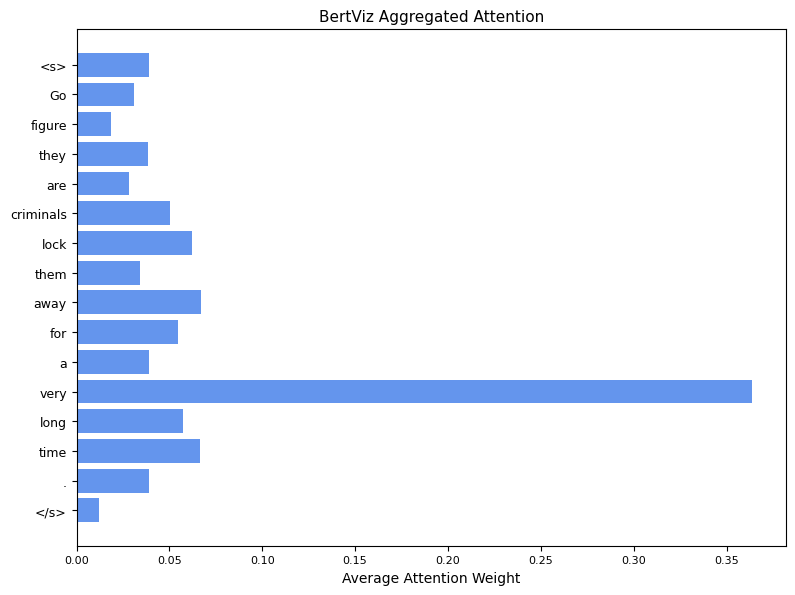

In [58]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Assuming `outputs.attentions` is available from your forward pass
# (outputs.attentions is a tuple: one tensor per layer of shape [batch, num_heads, seq_len, seq_len])
# We take the final layer’s attentions and average across heads and rows to get per-token importance.
final_layer_attn = outputs.attentions[-1][0]  # [num_heads, seq_len, seq_len] for first (and only) example
# Average attention scores for each token across heads and from all tokens (column-wise mean)
token_importance = final_layer_attn.mean(dim=0).mean(dim=0).cpu().detach().numpy()

# Convert tokens and clean them (remove RoBERTa's "Ġ" prefix)
tokens = tokenizer.convert_ids_to_tokens(encoded['input_ids'][0])
tokens_clean = [t[1:] if t.startswith("Ġ") else t for t in tokens]

# Plot as a horizontal bar chart
plt.figure(figsize=(8, 6))
plt.barh(range(len(tokens_clean)), token_importance, color='cornflowerblue')
plt.yticks(range(len(tokens_clean)), tokens_clean, fontsize=9)
plt.xlabel("Average Attention Weight", fontsize=10)
plt.title("BertViz Aggregated Attention", fontsize=11)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


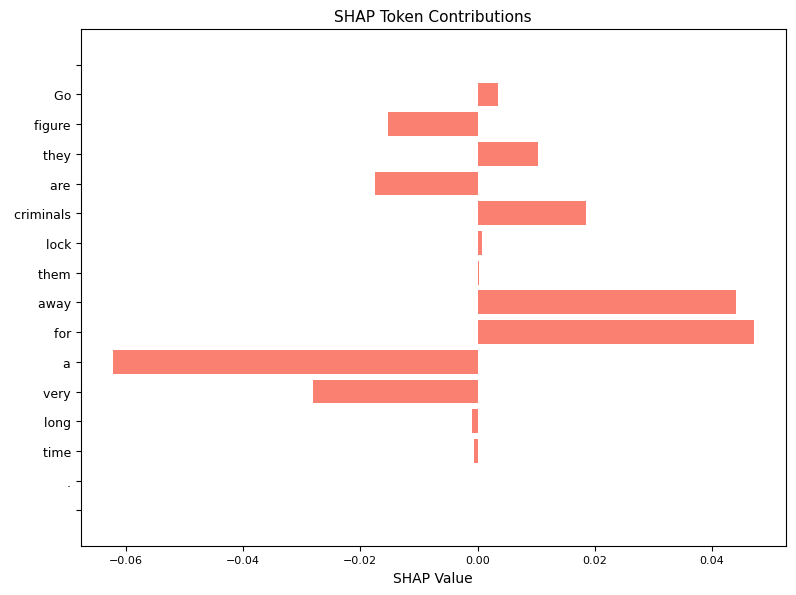

In [59]:
import matplotlib.pyplot as plt

# Assume shap_values was computed as in your code:
# shap_values = explainer([text])
# and then cleaned:
shap_values.data = clean_shap_tokens(shap_values)

# Extract SHAP values for the target class (for the first sample)
shap_vals = shap_values.values[0][:, target]
shap_tokens = shap_values.data[0]

# Plot SHAP values as a horizontal bar chart
plt.figure(figsize=(8, 6))
plt.barh(range(len(shap_tokens)), shap_vals, color='salmon')
plt.yticks(range(len(shap_tokens)), shap_tokens, fontsize=9)
plt.xlabel("SHAP Value", fontsize=10)
plt.title("SHAP Token Contributions", fontsize=11)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Data Paper

In [15]:
d15k = pd.read_json('/home/ravi/raviProject/DataModelsResults/Data/Labeled_15076.json', orient='records')

In [16]:
d15k.shape

(15076, 4)

In [17]:
d15k.head(1)

,replyDate,reply,telegramChannel,Label
0,1687098753,And HANG SCHIFF AND NADLER PELOSI AND ALL THE...,TrumpSupportersChannel.json,2


In [18]:
df = d15k.copy()

# Grouping by telegramChannel and counting occurrences
ddf = df.groupby('telegramChannel').agg(
    num_samples=('telegramChannel', 'size'),
    num_label_0=('Label', lambda x: (x == 0).sum()),
    num_label_1=('Label', lambda x: (x == 1).sum()),
    num_label_2=('Label', lambda x: (x == 2).sum())
).reset_index()

# Step 5: Sort by 'Combined Threat (Pred %)' in ascending order
ddf = ddf.sort_values(by='telegramChannel', ascending=True)

In [19]:
ddf

,telegramChannel,num_samples,num_label_0,num_label_1,num_label_2
0,AlexJones.json,72,23,27,22
1,AnalyzingAmerica.json,4255,936,1721,1598
2,AnticapitalistSurrealism.json,192,130,7,55
3,BlackCrimesMatter.json,7,2,1,4
4,COVIDVACCINEVICTIMS.json,153,88,38,27
5,DonaldTrumpJr.json,634,290,168,176
6,FreedomFighters.json,95,25,16,54
7,InfoWars.json,143,51,29,63
8,LacansWhreHouse.json,131,107,5,19
9,PatriotStreetfighter.json,387,199,65,123
